In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/leak-detection/Dataset for Leak Detection and Localization in Water Distribution Systems/Dataset for Leak Detection and Localization in Water Distribution Systems/Hydrophone/Branched/Gasket Leak/BR_GL_Transient_NS_H1.raw
/kaggle/input/leak-detection/Dataset for Leak Detection and Localization in Water Distribution Systems/Dataset for Leak Detection and Localization in Water Distribution Systems/Hydrophone/Branched/Gasket Leak/BR_GL_0.47 LPS_H2.raw
/kaggle/input/leak-detection/Dataset for Leak Detection and Localization in Water Distribution Systems/Dataset for Leak Detection and Localization in Water Distribution Systems/Hydrophone/Branched/Gasket Leak/BR_GL_0.18 LPS_H1.raw
/kaggle/input/leak-detection/Dataset for Leak Detection and Localization in Water Distribution Systems/Dataset for Leak Detection and Localization in Water Distribution Systems/Hydrophone/Branched/Gasket Leak/BR_GL_0.47 LPS_H1.raw
/kaggle/input/leak-detection/Dataset for Leak Detection and Localization

In [2]:

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, SimpleRNN, GRU
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
import os

import warnings
warnings.filterwarnings('ignore')

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl6StatusC1EN10tensorflow5error4CodeESt17basic_string_viewIcSt11char_traitsIcEENS_14SourceLocationE']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: l

In [3]:
# Path to the directory containing CSV files
csv_directory = '/kaggle/input/leak-detection/Dataset for Leak Detection and Localization in Water Distribution Systems/Dataset for Leak Detection and Localization in Water Distribution Systems/Accelerometer/Looped/Circumferential Crack'
# List all files in the directory
csv_files = [file for file in os.listdir(csv_directory) if file.endswith('.csv')]

dataframes = []

# Loop through the CSV files and read them into DataFrames
for file in csv_files:
    file_path = os.path.join(csv_directory, file)
    df = pd.read_csv(file_path)
    dataframes.append(df['Value'])

# Concatenate all DataFrames into a single DataFrame
df = pd.concat(dataframes, axis=1, ignore_index=True)

# Add leaktype
df["LeakType"] = "Circumferential Crack"

# Rename columns
df = df.rename(columns={0: "Value1", 1: "Value2", 2: "Value3", 3: "Value4", 4: "Value5", 5: "Value6", 6:"Value7", 7:"Value8"})

In [4]:
# Path to the directory containing CSV files
csv_directory1 = '/kaggle/input/leak-detection/Dataset for Leak Detection and Localization in Water Distribution Systems/Dataset for Leak Detection and Localization in Water Distribution Systems/Accelerometer/Looped/Gasket Leak'

# List all files in the directory
csv_files = [file for file in os.listdir(csv_directory1) if file.endswith('.csv')]

dataframes = []

# Loop through the CSV files and read them into DataFrames
for file in csv_files:
    file_path = os.path.join(csv_directory1, file)
    df1 = pd.read_csv(file_path)
    dataframes.append(df1['Value'])

# Concatenate all DataFrames into a single DataFrame
df1 = pd.concat(dataframes, axis=1, ignore_index=True)

# Add leaktype
df1["LeakType"] = "Gasket Leak"

# Rename columns
df1 = df1.rename(columns={0: "Value1", 1: "Value2", 2: "Value3", 3: "Value4", 4: "Value5", 5: "Value6", 6:"Value7", 7:"Value8"})

In [5]:
# Path to the directory containing CSV files
csv_directory2 = '/kaggle/input/leak-detection/Dataset for Leak Detection and Localization in Water Distribution Systems/Dataset for Leak Detection and Localization in Water Distribution Systems/Accelerometer/Looped/Longitudinal Crack'

# List all files in the directory
csv_files = [file for file in os.listdir(csv_directory2) if file.endswith('.csv')]

dataframes = []

# Loop through the CSV files and read them into DataFrames
for file in csv_files:
    file_path = os.path.join(csv_directory2, file)
    df2 = pd.read_csv(file_path)
    dataframes.append(df2['Value'])

# Concatenate all DataFrames into a single DataFrame
df2 = pd.concat(dataframes, axis=1, ignore_index=True)

# Add leaktype
df2["LeakType"] = "Longitudinal Crack"

# Rename columns
df2 = df2.rename(columns={0: "Value1", 1: "Value2", 2: "Value3", 3: "Value4", 4: "Value5", 5: "Value6", 6:"Value7", 7:"Value8"})

In [6]:
# Path to the directory containing CSV files
csv_directory3 = "/kaggle/input/leak-detection/Dataset for Leak Detection and Localization in Water Distribution Systems/Dataset for Leak Detection and Localization in Water Distribution Systems/Accelerometer/Looped/NonLeak"

# List all files in the directory
csv_files = [file for file in os.listdir(csv_directory3) if file.endswith('.csv')]

dataframes = []

# Loop through the CSV files and read them into DataFrames
for file in csv_files:
    file_path = os.path.join(csv_directory3, file)
    df3 = pd.read_csv(file_path)
    dataframes.append(df3['Value'])

# Concatenate all DataFrames into a single DataFrame
df3 = pd.concat(dataframes, axis=1, ignore_index=True)

# Add leaktype
df3["LeakType"] = "NonLeak"

# Rename columns
df3 = df3.rename(columns={0: "Value1", 1: "Value2", 2: "Value3", 3: "Value4", 4: "Value5", 5: "Value6", 6:"Value7", 7:"Value8"})

In [7]:
# Path to the directory containing CSV files
csv_directory4 = "/kaggle/input/leak-detection/Dataset for Leak Detection and Localization in Water Distribution Systems/Dataset for Leak Detection and Localization in Water Distribution Systems/Accelerometer/Looped/Orifice Leak"

# List all files in the directory
csv_files = [file for file in os.listdir(csv_directory4) if file.endswith('.csv')]

dataframes = []

# Loop through the CSV files and read them into DataFrames
for file in csv_files:
    file_path = os.path.join(csv_directory4, file)
    df4 = pd.read_csv(file_path)
    dataframes.append(df4['Value'])

# Concatenate all DataFrames into a single DataFrame
df4 = pd.concat(dataframes, axis=1, ignore_index=True)

# Add leaktype
df4["LeakType"] = "Orifice Leak"

# Rename columns
df4 = df4.rename(columns={0: "Value1", 1: "Value2", 2: "Value3", 3: "Value4", 4: "Value5", 5: "Value6", 6:"Value7", 7:"Value8"})

In [9]:
data = pd.concat([df, df1, df2, df3, df4], axis=0)
data = data.sample(frac = 1)
data

,Value1,Value2,Value3,Value4,Value5,Value6,Value7,Value8,LeakType
500130,-0.001950,-0.003888,-0.006145,-1.092220e-04,0.001905,0.012195,0.002706,0.000913,NonLeak
439416,-0.001018,0.002727,0.002158,-1.124479e-03,0.000001,-0.003206,0.000157,0.001487,Gasket Leak
765787,-0.001833,0.000890,-0.000403,2.600029e-03,0.000203,0.002185,-0.000692,-0.000363,Longitudinal Crack
388419,0.000420,0.001513,0.000381,2.050558e-03,0.000146,0.000347,-0.000074,-0.001788,Gasket Leak
380668,0.002728,-0.002532,-0.001288,-4.354762e-03,-0.000715,0.000623,-0.004501,-0.006125,Orifice Leak
...,...,...,...,...,...,...,...,...,...
391633,0.001305,0.003066,0.001241,-2.040845e-03,0.000209,-0.025027,-0.005217,0.008796,NonLeak
408039,-0.002255,0.002246,-0.000250,-1.402503e-03,0.000062,0.006194,0.003335,-0.003470,NonLeak
756267,0.001907,-0.000080,-0.000951,-5.891217e-03,0.000049,-0.000528,0.000200,0.000629,Gasket Leak
831868,0.001710,0.000894,-0.000004,4.280000e-07,0.000331,-0.000379,-0.019483,0.003205,NonLeak


In [10]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4795399 entries, 500130 to 284050
Data columns (total 9 columns):
 #   Column    Dtype  
---  ------    -----  
 0   Value1    float64
 1   Value2    float64
 2   Value3    float64
 3   Value4    float64
 4   Value5    float64
 5   Value6    float64
 6   Value7    float64
 7   Value8    float64
 8   LeakType  object 
dtypes: float64(8), object(1)
memory usage: 365.9+ MB


In [11]:
data.describe()

,Value1,Value2,Value3,Value4,Value5,Value6,Value7,Value8
count,4.604145e+06,4.669405e+06,4.693954e+06,4.621112e+06,4.584481e+06,4.647458e+06,4.622477e+06,4.655217e+06
mean,2.006600e-04,1.389596e-04,2.270755e-04,-1.513024e-04,2.634670e-04,4.558405e-04,1.389277e-04,1.826358e-04
std,2.728121e-03,2.074907e-03,1.979446e-03,3.268627e-03,4.193245e-03,5.658094e-03,7.558778e-03,3.410347e-03
min,-2.210458e-02,-1.202732e-02,-1.241157e-02,-2.491396e-02,-5.124693e-02,-2.263872e-01,-6.699903e-02,-3.802159e-02
25%,-1.353308e-03,-1.219479e-03,-8.161760e-04,-1.698855e-03,2.690000e-05,-1.077108e-03,-3.035340e-04,-1.075330e-03
50%,3.773880e-04,1.580870e-04,2.186680e-04,6.950000e-06,1.917810e-04,5.353350e-04,1.475670e-04,3.059010e-04
75%,1.898860e-03,1.501155e-03,1.278607e-03,1.283040e-03,6.267510e-04,2.111502e-03,6.357130e-04,1.916048e-03
max,2.580000e-02,1.242054e-02,2.675001e-02,4.462438e-02,5.768959e-02,2.361638e-01,6.388133e-02,2.898938e-02


In [12]:
from pandas_profiling import ProfileReport
ProfileReport(data)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [13]:
label_encoder = LabelEncoder()
data['category_label_encoded'] = label_encoder.fit_transform(data['LeakType'])

In [14]:
data = data.dropna()
print(data.describe())


             Value1        Value2        Value3        Value4        Value5  \
count  4.560556e+06  4.560556e+06  4.560556e+06  4.560556e+06  4.560556e+06   
mean   1.992400e-04  1.359413e-04  2.237784e-04 -1.538141e-04  2.638024e-04   
std    2.734709e-03  2.073666e-03  1.980326e-03  3.281611e-03  4.203484e-03   
min   -2.210458e-02 -1.202732e-02 -1.241157e-02 -2.491396e-02 -5.124693e-02   
25%   -1.356303e-03 -1.219357e-03 -8.155790e-04 -1.704782e-03  2.750000e-05   
50%    3.767950e-04  1.539380e-04  2.085110e-04  5.960000e-06  1.923790e-04   
75%    1.899452e-03  1.493450e-03  1.271437e-03  1.281854e-03  6.261530e-04   
max    2.580000e-02  1.242054e-02  2.675001e-02  4.462438e-02  5.768959e-02   

             Value6        Value7        Value8  category_label_encoded  
count  4.560556e+06  4.560556e+06  4.560556e+06            4.560556e+06  
mean   4.570469e-04  1.384578e-04  1.849259e-04            1.993778e+00  
std    5.705849e-03  7.562667e-03  3.422671e-03            1.41437

In [15]:
data.nunique()

Value1                     66366
Value2                     44994
Value3                     54470
Value4                     93602
Value5                    123752
Value6                    128840
Value7                    119539
Value8                     87040
LeakType                       5
category_label_encoded         5
dtype: int64

In [16]:
data.drop_duplicates(inplace=True)


In [17]:
data.describe()

,Value1,Value2,Value3,Value4,Value5,Value6,Value7,Value8,category_label_encoded
count,4.560556e+06,4.560556e+06,4.560556e+06,4.560556e+06,4.560556e+06,4.560556e+06,4.560556e+06,4.560556e+06,4.560556e+06
mean,1.992400e-04,1.359413e-04,2.237784e-04,-1.538141e-04,2.638024e-04,4.570469e-04,1.384578e-04,1.849259e-04,1.993778e+00
std,2.734709e-03,2.073666e-03,1.980326e-03,3.281611e-03,4.203484e-03,5.705849e-03,7.562667e-03,3.422671e-03,1.414375e+00
min,-2.210458e-02,-1.202732e-02,-1.241157e-02,-2.491396e-02,-5.124693e-02,-2.263872e-01,-6.699903e-02,-3.802159e-02,0.000000e+00
25%,-1.356303e-03,-1.219357e-03,-8.155790e-04,-1.704782e-03,2.750000e-05,-1.080862e-03,-3.083140e-04,-1.097592e-03,1.000000e+00
50%,3.767950e-04,1.539380e-04,2.085110e-04,5.960000e-06,1.923790e-04,5.374180e-04,1.487620e-04,3.226310e-04,2.000000e+00
75%,1.899452e-03,1.493450e-03,1.271437e-03,1.281854e-03,6.261530e-04,2.117567e-03,6.404930e-04,1.940942e-03,3.000000e+00
max,2.580000e-02,1.242054e-02,2.675001e-02,4.462438e-02,5.768959e-02,2.361638e-01,6.388133e-02,2.898938e-02,4.000000e+00


In [18]:
from scipy.stats import zscore

# Calculate z-scores for numerical columns
z_scores = data.select_dtypes(include=['float64']).apply(zscore)

# Define a threshold for identifying outliers (adjust as needed)
threshold = 3

# Identify and remove outliers
data_no_outliers = data[(z_scores.abs() < threshold).all(axis=1)]

# Compare shapes to see how many outliers were removed
print("Original shape:", data.shape)
print("Data without outliers shape:", data_no_outliers.shape)

# Check for missing values after removing outliers
missing_values_after = data_no_outliers.isna().sum()
print("Missing values after removing outliers:")
print(missing_values_after)

Original shape: (4560556, 10)
Data without outliers shape: (3881618, 10)
Missing values after removing outliers:
Value1                    0
Value2                    0
Value3                    0
Value4                    0
Value5                    0
Value6                    0
Value7                    0
Value8                    0
LeakType                  0
category_label_encoded    0
dtype: int64


In [19]:
from pandas_profiling import ProfileReport
ProfileReport(data)


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

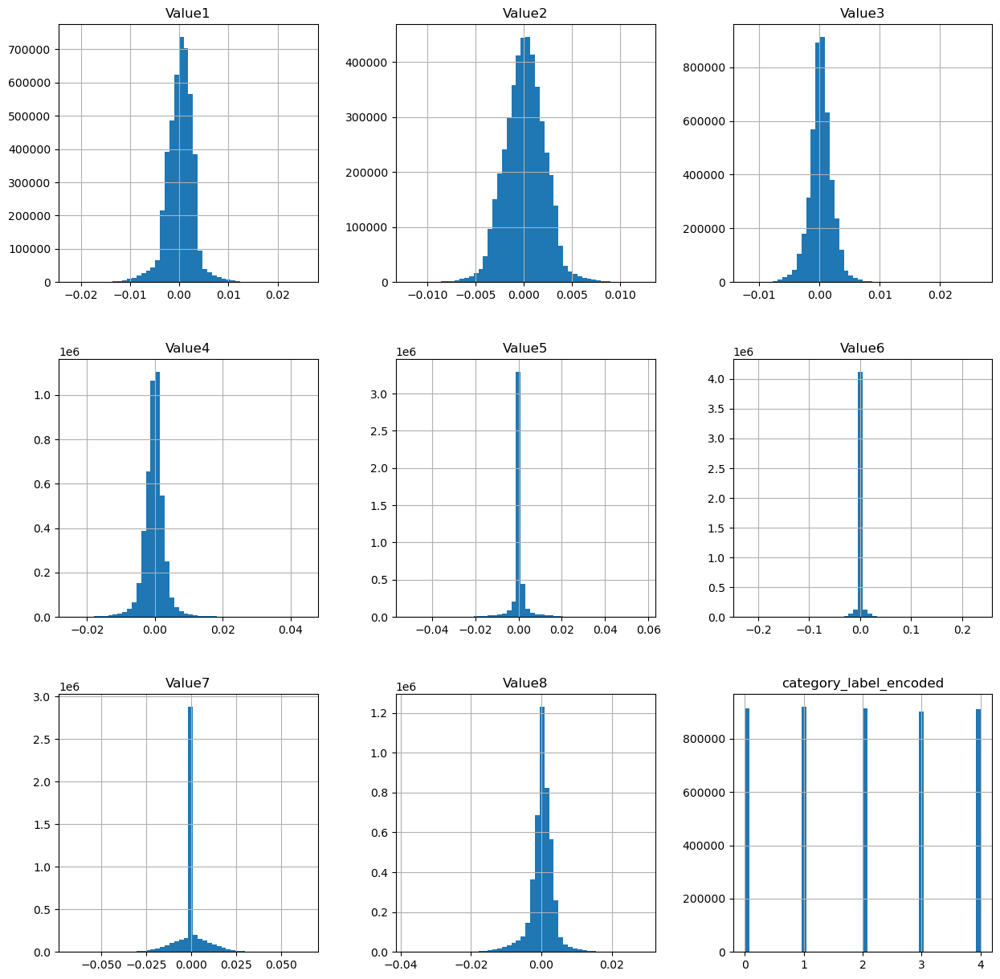

In [20]:
data.hist(bins=50, figsize=(15,15))
plt.show()

In [21]:
# Calculate summary statistics
summary_stats = data.describe(percentiles=[0.1, 0.25, 0.5, 0.75, 0.9])
skewness = data.skew()
kurtosis = data.kurtosis()
correlation_matrix = data.corr()

# Count missing values
missing_values = data.isnull().sum()
missing_percent = (missing_values / len(data)) * 100

# Print or analyze the calculated statistics as needed
print(summary_stats)
print(skewness)
print(kurtosis)
print(correlation_matrix)
print(missing_values)
print(missing_percent)






             Value1        Value2        Value3        Value4        Value5  \
count  4.560556e+06  4.560556e+06  4.560556e+06  4.560556e+06  4.560556e+06   
mean   1.992400e-04  1.359413e-04  2.237784e-04 -1.538141e-04  2.638024e-04   
std    2.734709e-03  2.073666e-03  1.980326e-03  3.281611e-03  4.203484e-03   
min   -2.210458e-02 -1.202732e-02 -1.241157e-02 -2.491396e-02 -5.124693e-02   
10%   -2.903193e-03 -2.506118e-03 -2.040845e-03 -3.442125e-03 -1.414857e-03   
25%   -1.356303e-03 -1.219357e-03 -8.155790e-04 -1.704782e-03  2.750000e-05   
50%    3.767950e-04  1.539380e-04  2.085110e-04  5.960000e-06  1.923790e-04   
75%    1.899452e-03  1.493450e-03  1.271437e-03  1.281854e-03  6.261530e-04   
90%    3.108933e-03  2.735165e-03  2.489112e-03  2.951566e-03  2.008510e-03   
max    2.580000e-02  1.242054e-02  2.675001e-02  4.462438e-02  5.768959e-02   

             Value6        Value7        Value8  category_label_encoded  
count  4.560556e+06  4.560556e+06  4.560556e+06         

<Figure size 1200x800 with 0 Axes>

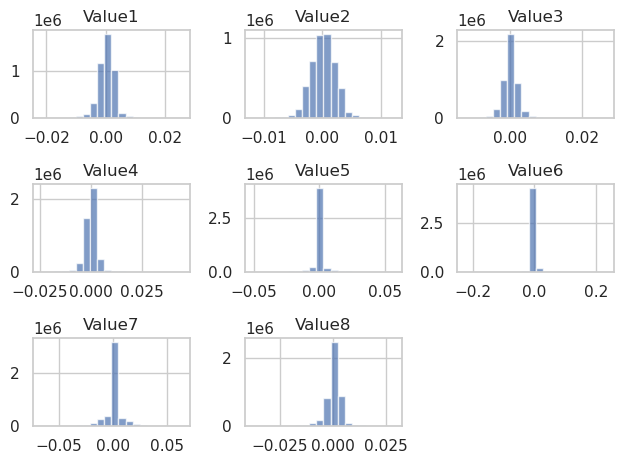

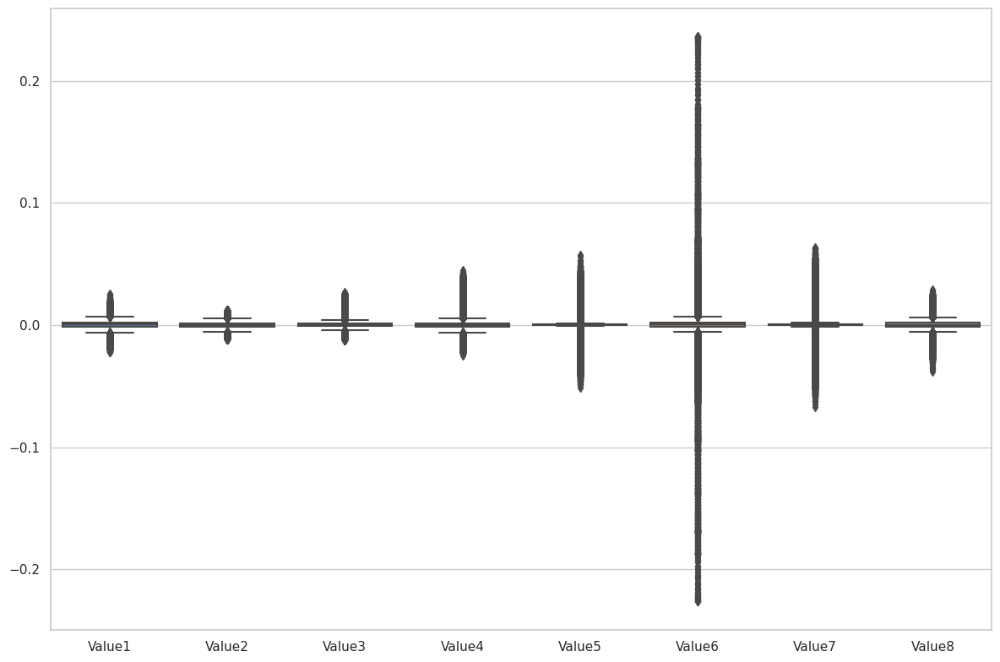

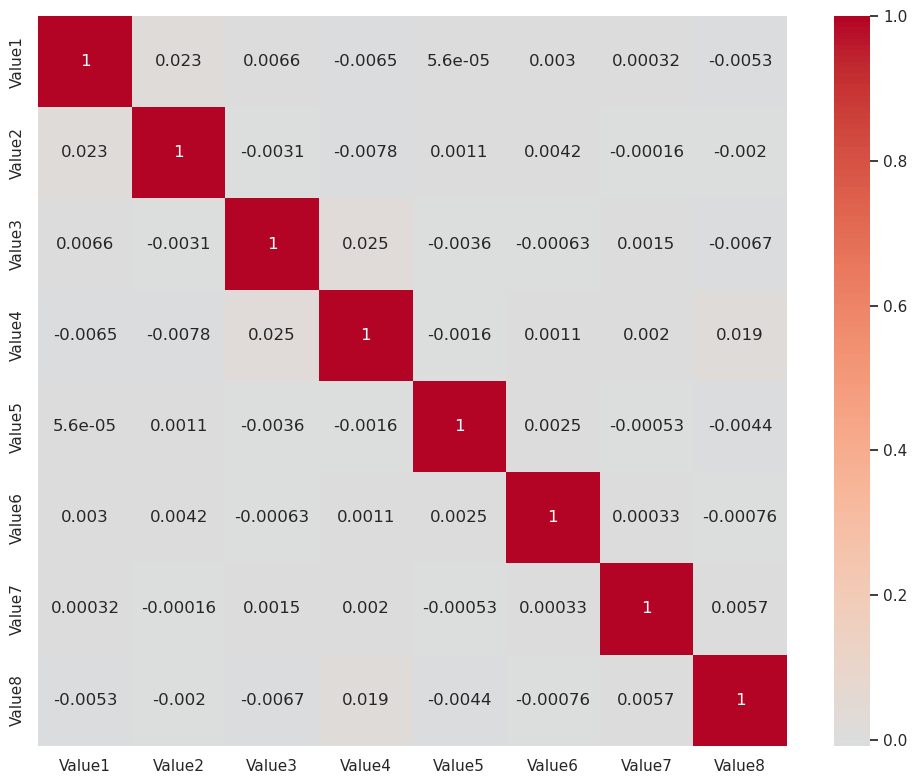

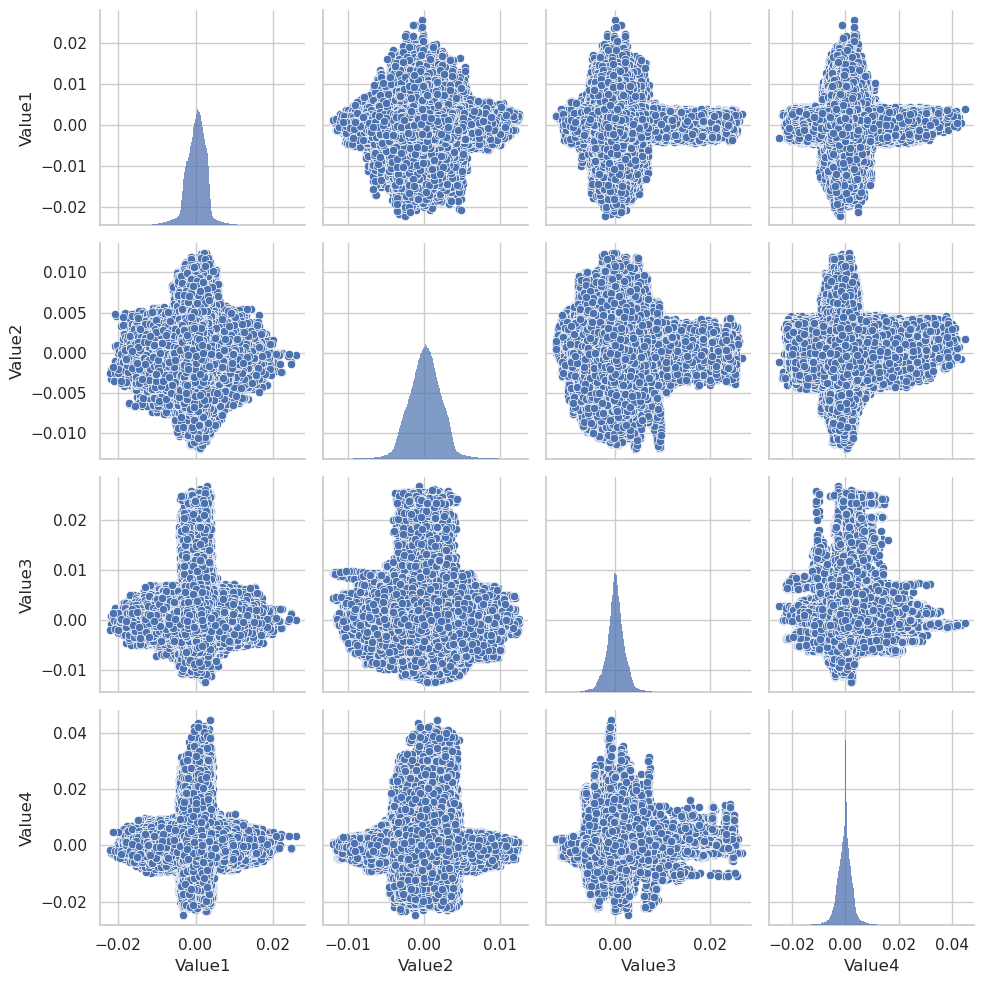

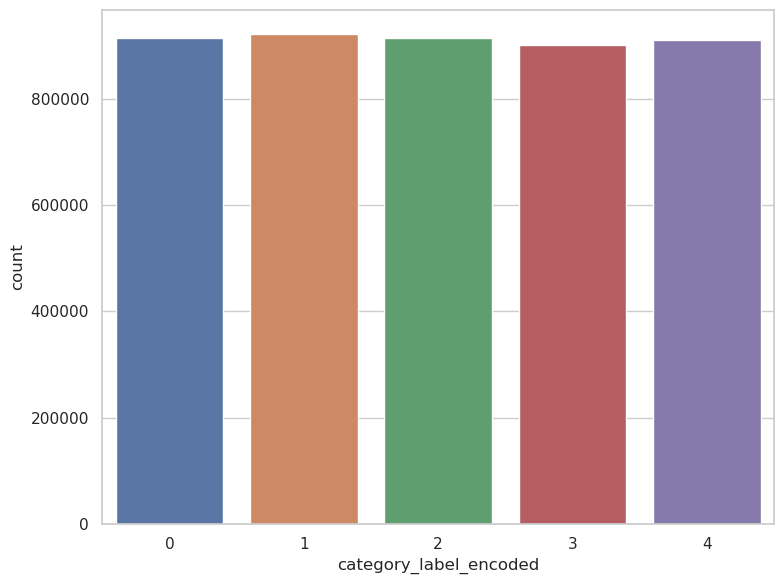

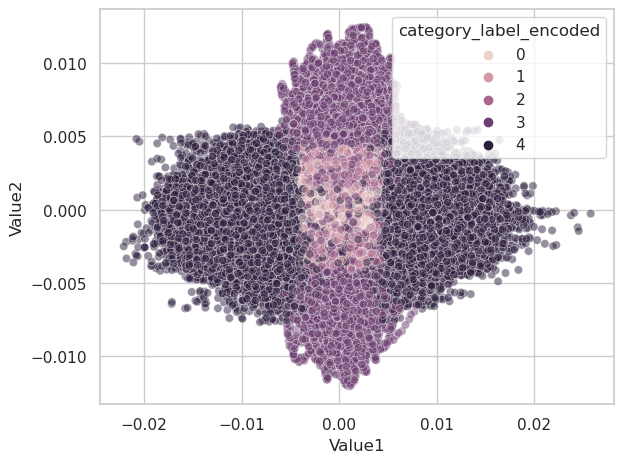

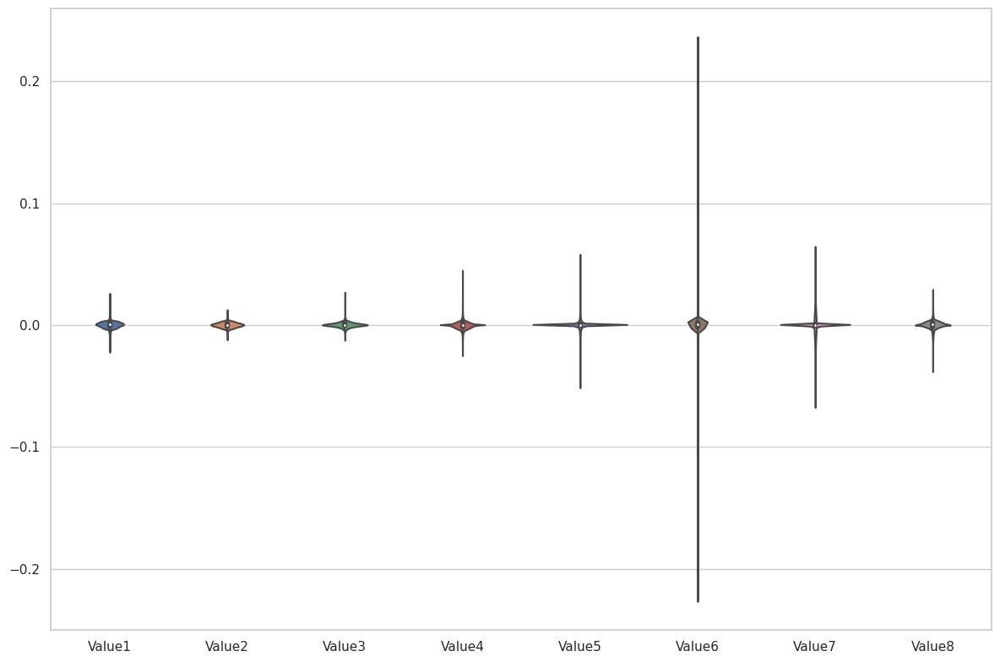

In [22]:


# Set style for Seaborn plots
sns.set(style="whitegrid")

# Histograms
numerical_columns = ['Value1', 'Value2', 'Value3', 'Value4', 'Value5', 'Value6', 'Value7', 'Value8']
plt.figure(figsize=(12, 8))
data[numerical_columns].hist(bins=20, alpha=0.7)
plt.tight_layout()
plt.show()

# Box Plots
plt.figure(figsize=(12, 8))
sns.boxplot(data=data[numerical_columns])
plt.tight_layout()
plt.show()

# Correlation Heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(data[numerical_columns].corr(), annot=True, cmap='coolwarm', center=0)
plt.tight_layout()
plt.show()

# Pair Plots (select a subset if there are too many variables)
sns.pairplot(data[numerical_columns[:4]])
plt.tight_layout()
plt.show()

# Bar Plots (for categorical variables)
plt.figure(figsize=(8, 6))
sns.countplot(data=data, x='category_label_encoded')
plt.tight_layout()
plt.show()

# Scatter Plots (for pairs of numerical variables)
sns.scatterplot(data=data, x='Value1', y='Value2', hue='category_label_encoded', alpha=0.5)
plt.tight_layout()
plt.show()

# Violin Plots
plt.figure(figsize=(12, 8))
sns.violinplot(data=data[numerical_columns])
plt.tight_layout()
plt.show()

# Time Series Plot (if applicable, assuming a time column named 'Time')
# plt.figure(figsize=(12, 8))
# sns.lineplot(data=data, x='Time', y='Value1')
# plt.tight_layout()
# plt.show()


spilliting the data

In [23]:
# Assuming you have already preprocessed your data and split it into X and y
X = data.drop(['LeakType', 'category_label_encoded'], axis=1)  # Features
y = data['category_label_encoded']  # Target

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [24]:
# Standardize features (Z-score scaling)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

RNN MODEL

In [ ]:
# # Reshape the input data for RNN
# X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
# X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))

In [ ]:
# # Build the RNN model
# model = Sequential()
# model.add(SimpleRNN(64, activation='relu', input_shape=(X_train.shape[1], 1)))
# model.add(Dense(64, activation='relu'))
# model.add(Dense(1, activation='sigmoid'))

# # Compile the model
# model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

# # Train the model
# model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test))



# # Evaluate the model
# loss, accuracy = model.evaluate(X_test, y_test)
# print(f'Test Loss: {loss:.4f}')
# print(f'Test Accuracy: {accuracy:.4f}')



DNN

In [ ]:
# Build DNN model
model = Sequential()
model.add(Dense(64, activation='relu', input_shape=(X_train_scaled.shape[1],)))
model.add(Dense(64, activation='relu'))
model.add(Dense(5, activation='softmax'))  # Output layer, 5 for the number of unique categories

# Compile model
model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# Train model
history = model.fit(X_train_scaled, y_train, epochs=20, batch_size=16, validation_data=(X_test_scaled, y_test))

# Evaluate model
test_loss, test_accuracy = model.evaluate(X_test_scaled, y_test)
print(f'Test Loss: {test_loss:.4f}')
print(f'Test Accuracy: {test_accuracy:.4f}')

# Make predictions
predictions = model.predict(X_test_scaled)

# Optionally, you can convert the predicted probabilities to class labels
predicted_labels = predictions.argmax(axis=1)







Epoch 1/20
228028/228028 [==============================] - 801s 3ms/step - loss: 0.2591 - accuracy: 0.8999 - val_loss: 0.2381 - val_accuracy: 0.9079
Epoch 2/20
228028/228028 [==============================] - 796s 3ms/step - loss: 0.2365 - accuracy: 0.9086 - val_loss: 0.2322 - val_accuracy: 0.9103
Epoch 3/20
228028/228028 [==============================] - 740s 3ms/step - loss: 0.2338 - accuracy: 0.9096 - val_loss: 0.2308 - val_accuracy: 0.9113
Epoch 4/20
228028/228028 [==============================] - 740s 3ms/step - loss: 0.2327 - accuracy: 0.9102 - val_loss: 0.2344 - val_accuracy: 0.9099
Epoch 5/20
228028/228028 [==============================] - 739s 3ms/step - loss: 0.2320 - accuracy: 0.9104 - val_loss: 0.2338 - val_accuracy: 0.9101
Epoch 6/20
228028/228028 [==============================] - 737s 3ms/step - loss: 0.2317 - accuracy: 0.9105 - val_loss: 0.2352 - val_accuracy: 0.9096
Epoch 7/20
228028/228028 [==============================] - 793s 3ms/step - loss: 0.2315 - accuracy:

LSTM

In [ ]:
# # Build the LSTM model
# model = Sequential()
# model.add(LSTM(64, activation='relu', input_shape=(X_train.shape[1], 1)))
# model.add(Dense(64, activation='relu'))
# model.add(Dense(1, activation='sigmoid'))

# # Compile the model
# model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


# # Train the model
# model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test))


# # Evaluate the model
# loss, accuracy = model.evaluate(X_test, y_test)
# print(f'Test Loss: {loss:.4f}')
# print(f'Test Accuracy: {accuracy:.4f}')

GRU

In [ ]:
# # Reshape the input data for GRU
# X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
# X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))

# # Build the GRU model
# model = Sequential()
# model.add(GRU(64, activation='relu', input_shape=(X_train.shape[1], 1)))
# model.add(Dense(64, activation='relu'))
# model.add(Dense(1, activation='sigmoid'))

# # Compile the model
# model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


# # Train the model
# model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test))

# # Evaluate the model
# loss, accuracy = model.evaluate(X_test, y_test)
# print(f'Test Loss: {loss:.4f}')
# print(f'Test Accuracy: {accuracy:.4f}')
